import libraries

In [ ]:
import numpy as np  # linear algebra
import pandas as pd  # read and wrangle dataframes
import matplotlib.pyplot as plt # visualization
import seaborn as sns # statistical visualizations and aesthetics
from sklearn.base import TransformerMixin # To create new classes for transformations
from sklearn.preprocessing import (FunctionTransformer, StandardScaler) # preprocessing
from sklearn.decomposition import PCA # dimensionality reduction
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from scipy.stats import boxcox # data transform
from sklearn.model_selection import (train_test_split, KFold , StratifiedKFold,
                                     cross_val_score, GridSearchCV,
                                     learning_curve, validation_curve) # model selection modules
from sklearn.pipeline import Pipeline # streaming pipelines
from sklearn.base import BaseEstimator, TransformerMixin # To create a box-cox transformation class
from collections import Counter
import warnings
# load models
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
#from xgboost import (XGBClassifier, plot_importance)
from sklearn.svm import SVC
from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from time import time

%matplotlib inline
warnings.filterwarnings('ignore')
sns.set_style('whitegrid')

In [ ]:
glass = pd.read_csv("C:/Users/Dhiru/Desktop/glass.csv")

In [ ]:
glass

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.00,0.0,1
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.00,0.0,1
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.00,0.0,1
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.00,0.0,1
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.00,0.0,1
...,...,...,...,...,...,...,...,...,...,...
209,1.51623,14.14,0.00,2.88,72.61,0.08,9.18,1.06,0.0,7
210,1.51685,14.92,0.00,1.99,73.06,0.00,8.40,1.59,0.0,7
211,1.52065,14.36,0.00,2.02,73.42,0.00,8.44,1.64,0.0,7
212,1.51651,14.38,0.00,1.94,73.61,0.00,8.48,1.57,0.0,7


In [ ]:
features = glass.columns[:-1].tolist()
glass.shape

(214, 10)

In [ ]:
glass.dtypes

RI      float64
Na      float64
Mg      float64
Al      float64
Si      float64
K       float64
Ca      float64
Ba      float64
Fe      float64
Type      int64
dtype: object

Summarize the data

In [ ]:
glass.describe()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
count,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000
mean,1.518365,13.407850,2.684533,1.444907,72.650935,0.497056,8.956963,0.175047,0.057009,2.780374
std,0.003037,0.816604,1.442408,0.499270,0.774546,0.652192,1.423153,0.497219,0.097439,2.103739
min,1.511150,10.730000,0.000000,0.290000,69.810000,0.000000,5.430000,0.000000,0.000000,1.000000
25%,1.516522,12.907500,2.115000,1.190000,72.280000,0.122500,8.240000,0.000000,0.000000,1.000000
50%,1.517680,13.300000,3.480000,1.360000,72.790000,0.555000,8.600000,0.000000,0.000000,2.000000
75%,1.519157,13.825000,3.600000,1.630000,73.087500,0.610000,9.172500,0.000000,0.100000,3.000000
max,1.533930,17.380000,4.490000,3.500000,75.410000,6.210000,16.190000,3.150000,0.510000,7.000000


In [ ]:
print('The input features of the data is:')
X = glass.drop('Type',axis = 1)
X

The input features of the data is:


,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.00,0.0
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.00,0.0
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.00,0.0
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.00,0.0
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.00,0.0
...,...,...,...,...,...,...,...,...,...
209,1.51623,14.14,0.00,2.88,72.61,0.08,9.18,1.06,0.0
210,1.51685,14.92,0.00,1.99,73.06,0.00,8.40,1.59,0.0
211,1.52065,14.36,0.00,2.02,73.42,0.00,8.44,1.64,0.0
212,1.51651,14.38,0.00,1.94,73.61,0.00,8.48,1.57,0.0


In [ ]:
print('Output of our data set is')
y = glass['Type']
y

Output of our data set is


0      1
1      1
2      1
3      1
4      1
      ..
209    7
210    7
211    7
212    7
213    7
Name: Type, Length: 214, dtype: int64

In [ ]:
glass['Type'].value_counts()

2    76
1    70
7    29
3    17
5    13
6     9
Name: Type, dtype: int64

# **Data Visualization**

univariate plots

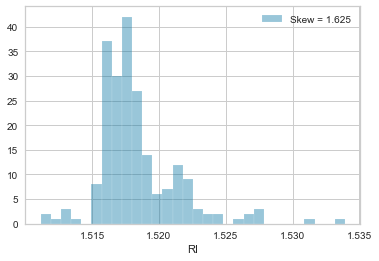

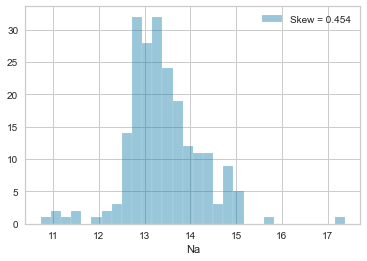

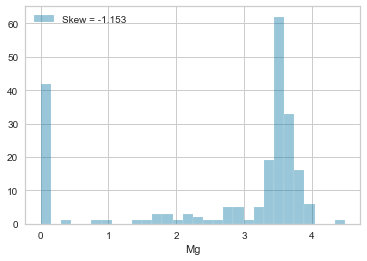

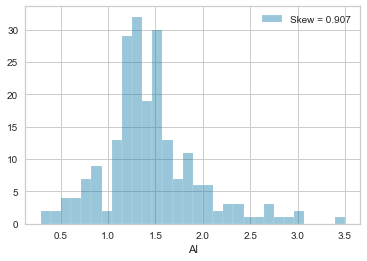

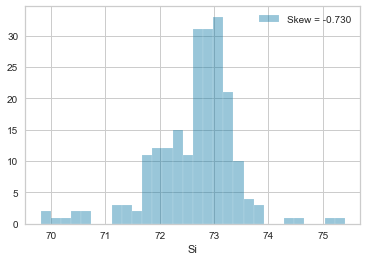

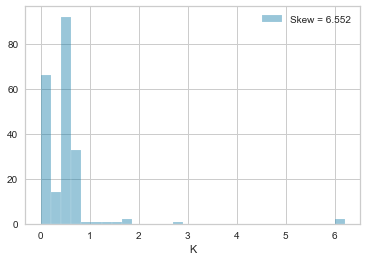

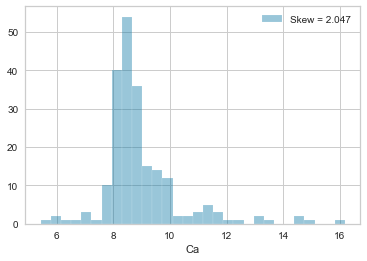

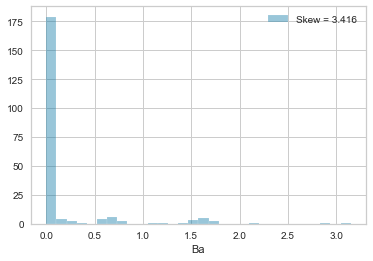

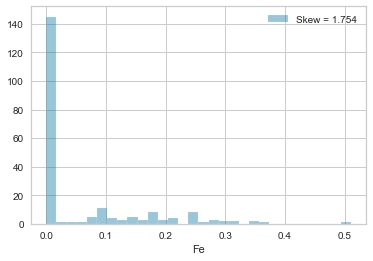

In [ ]:
for feat in features:
    skew = glass[feat].skew()
    sns.distplot(glass[feat], kde= False, label='Skew = %.3f' %(skew), bins=30)
    plt.legend(loc='best')
    plt.show()

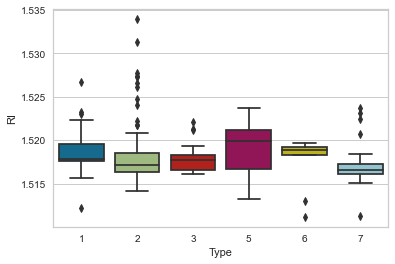

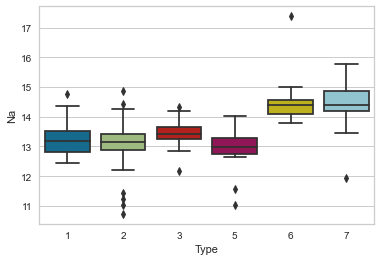

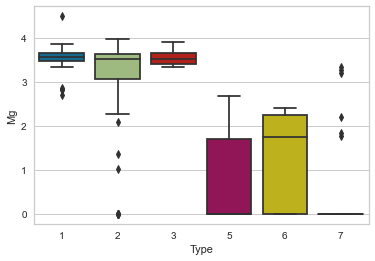

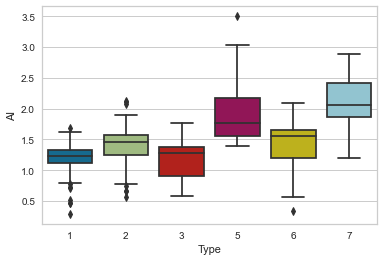

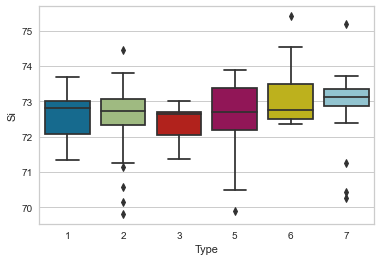

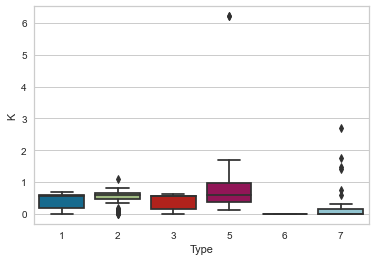

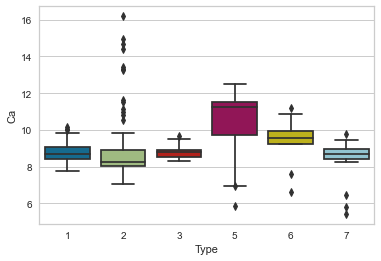

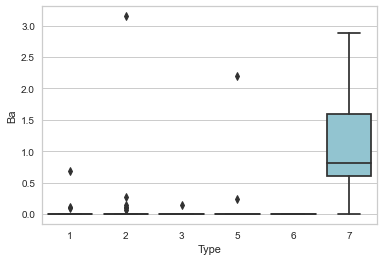

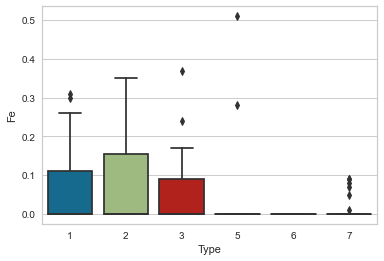

In [ ]:
for i in range(0,9):
    sns.boxplot(x = "Type" , y = features[i] , data = glass)
    plt.ylabel(features[i])
    plt.show()

### **Checking the presence of null values in the Dataset**

In [ ]:
glass.isna().sum()

RI      0
Na      0
Mg      0
Al      0
Si      0
K       0
Ca      0
Ba      0
Fe      0
Type    0
dtype: int64

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
X_scaled = pd.DataFrame(X)

### **Checking Outliers in the Dataset **

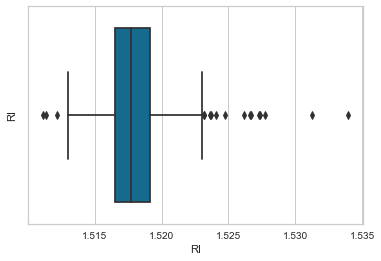

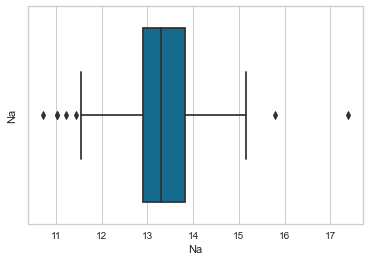

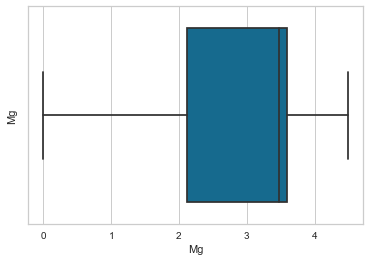

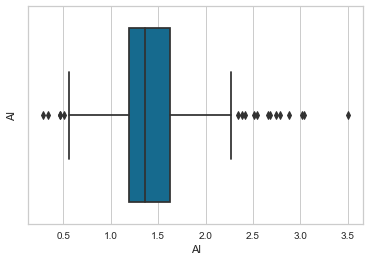

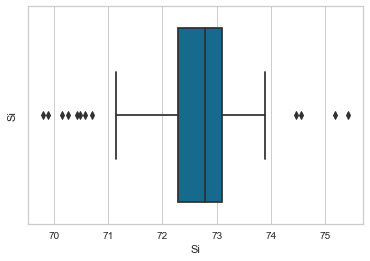

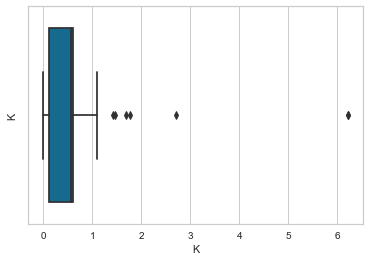

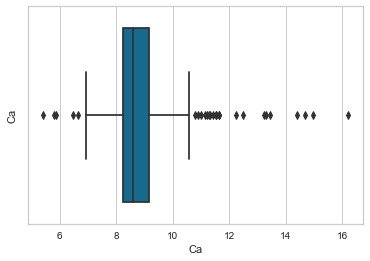

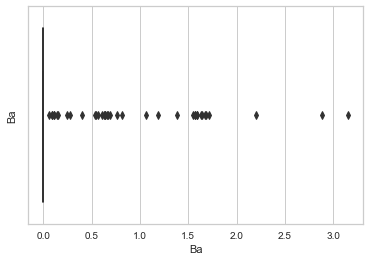

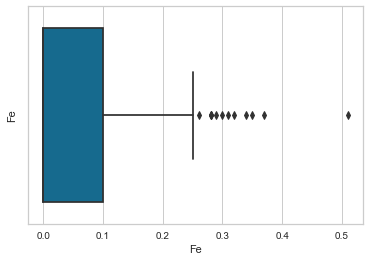

In [ ]:
for i in range(0,9):
       sns.boxplot(x = features[i],data = glass)
       plt.ylabel(features[i])
       plt.show()

<AxesSubplot:>

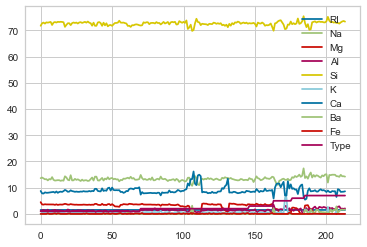

In [ ]:
glass.plot()

HISTOGRAM





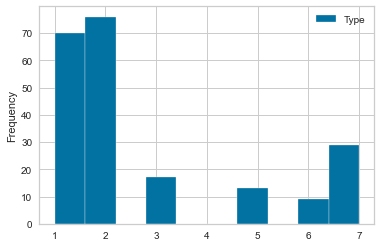

In [ ]:
glass.plot(kind ='hist',y='Type')
plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


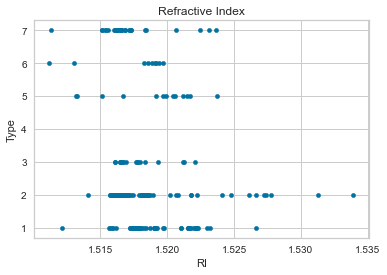

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


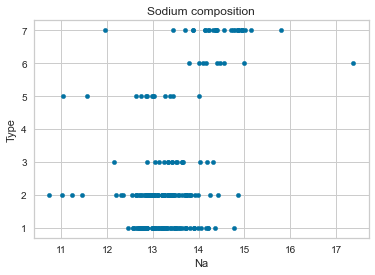

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


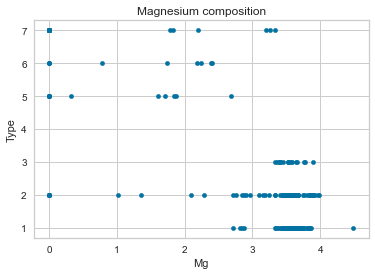

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


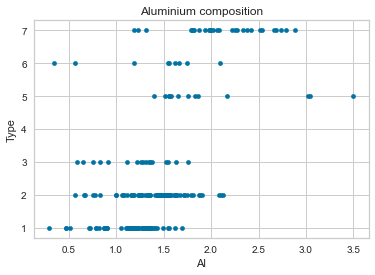

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


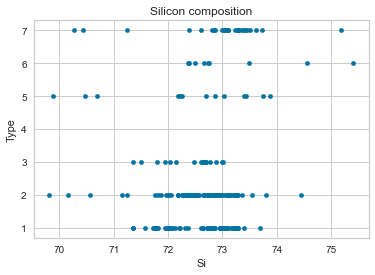

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


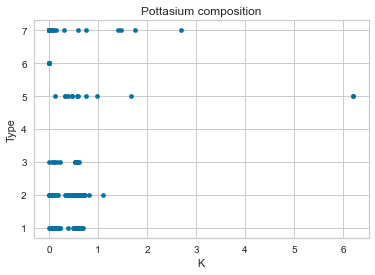

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


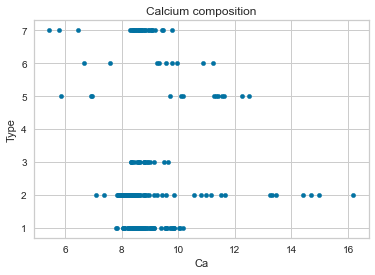

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


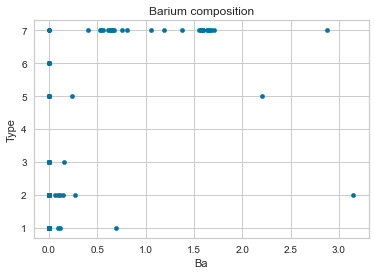

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


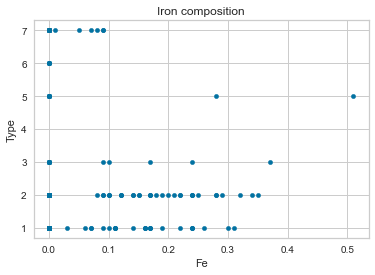

In [ ]:

glass.plot(kind ='scatter',x='RI',y='Type')
plt.title('Refractive Index')
plt.show()

glass.plot(kind ='scatter',x='Na',y='Type')
plt.title('Sodium composition')
plt.show()

glass.plot(kind ='scatter',x='Mg',y='Type')
plt.title('Magnesium composition')
plt.show()

glass.plot(kind ='scatter',x='Al',y='Type')
plt.title('Aluminium composition')
plt.show()

glass.plot(kind ='scatter',x='Si',y='Type')
plt.title('Silicon composition')
plt.show()

glass.plot(kind ='scatter',x='K',y='Type')
plt.title('Pottasium composition')
plt.show()

glass.plot(kind ='scatter',x='Ca',y='Type')
plt.title('Calcium composition')
plt.show()

glass.plot(kind ='scatter',x='Ba',y='Type')
plt.title('Barium composition')
plt.show()

glass.plot(kind ='scatter',x='Fe',y='Type')
plt.title('Iron composition')
plt.show()


In [ ]:
features = ['RI','Na','Mg','Al','Si','K','Ca','Ba','Fe']
label = ['Type']

X = glass[features]
y = glass[label]

**Pairplot** to plot bivariate distributions

<Figure size 720x720 with 0 Axes>

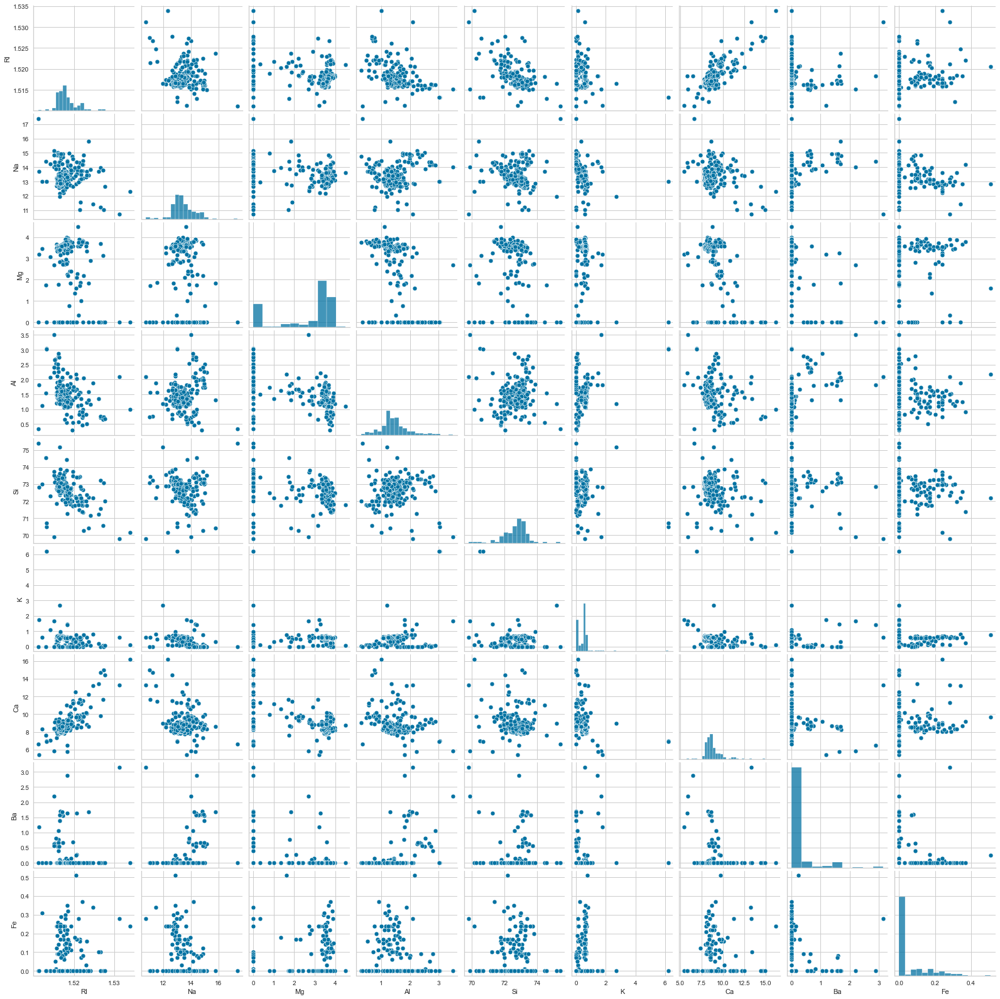

In [ ]:
import seaborn as sns
x2 = pd.DataFrame(X)

plt.figure(figsize=(10,10))
sns.pairplot(data=x2)
plt.show()

In [ ]:
glass.corr()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
RI,1.000000,-0.191885,-0.122274,-0.407326,-0.542052,-0.289833,0.810403,-0.000386,0.143010,-0.164237
Na,-0.191885,1.000000,-0.273732,0.156794,-0.069809,-0.266087,-0.275442,0.326603,-0.241346,0.502898
Mg,-0.122274,-0.273732,1.000000,-0.481799,-0.165927,0.005396,-0.443750,-0.492262,0.083060,-0.744993
Al,-0.407326,0.156794,-0.481799,1.000000,-0.005524,0.325958,-0.259592,0.479404,-0.074402,0.598829
Si,-0.542052,-0.069809,-0.165927,-0.005524,1.000000,-0.193331,-0.208732,-0.102151,-0.094201,0.151565
K,-0.289833,-0.266087,0.005396,0.325958,-0.193331,1.000000,-0.317836,-0.042618,-0.007719,-0.010054
Ca,0.810403,-0.275442,-0.443750,-0.259592,-0.208732,-0.317836,1.000000,-0.112841,0.124968,0.000952
Ba,-0.000386,0.326603,-0.492262,0.479404,-0.102151,-0.042618,-0.112841,1.000000,-0.058692,0.575161
Fe,0.143010,-0.241346,0.083060,-0.074402,-0.094201,-0.007719,0.124968,-0.058692,1.000000,-0.188278
Type,-0.164237,0.502898,-0.744993,0.598829,0.151565,-0.010054,0.000952,0.575161,-0.188278,1.000000


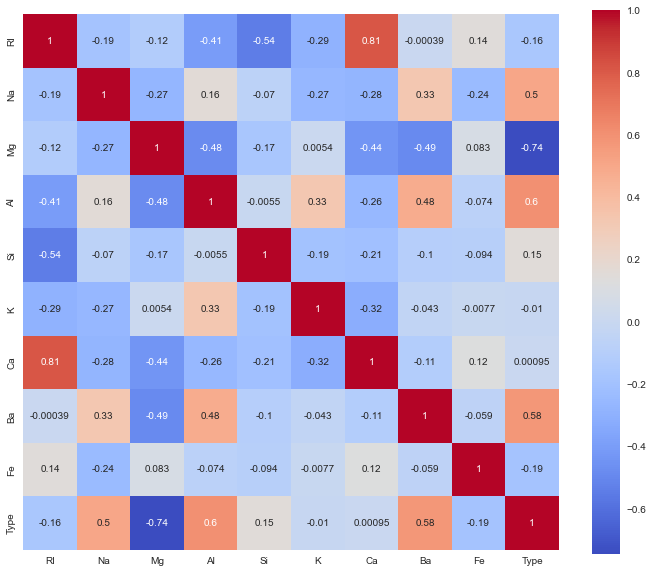

In [ ]:
correlation= glass.corr()
plt.figure(figsize=(12,10))
sns.heatmap(correlation, cbar=True, square=True, annot=True,cmap= 'coolwarm')
plt.show()

In [ ]:
#x needed
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y,train_size=0.70, test_size=0.30)

# logistic Regression

              precision    recall  f1-score   support

           1       0.57      0.77      0.65        22
           2       0.65      0.58      0.61        26
           3       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         1
           6       0.50      0.50      0.50         2
           7       1.00      1.00      1.00        10

    accuracy                           0.66        65
   macro avg       0.45      0.47      0.46        65
weighted avg       0.62      0.66      0.64        65

Classification Accuracy = 0.6615384615384615


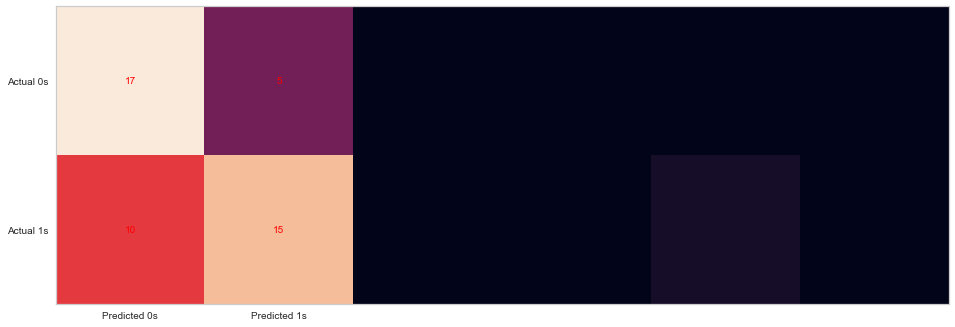

In [ ]:

from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score
clf1 = OneVsRestClassifier(LogisticRegression(C =10 , random_state=1367))
clf1.fit(X_train , y_train)
y1 = clf1.predict(X_test)
print (classification_report(y_test , y1))
print ("Classification Accuracy = " + str(accuracy_score(y_test , y1)))
# print("Accuracy for training set: ",tree_model.score(X_train,y_train))
# print("Accuracy for test set: ",tree_model.score(X_test,y_test))
#confusion matrix
cm = confusion_matrix(y_test, clf1.predict(X_test))

fig, ax = plt.subplots(figsize=(16, 16))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted 0s', 'Predicted 1s'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual 0s', 'Actual 1s'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='red')
plt.show()

# Decision tree

In [ ]:

from sklearn.tree import DecisionTreeClassifier
import time
start = time.time()
tree_model = DecisionTreeClassifier(random_state=0).fit(X_train, y_train)
tree_predictions = tree_model.predict(X_test)
end = time.time()
print("Accuracy for training set: ",tree_model.score(X_train,y_train))
print("Accuracy for test set: ",tree_model.score(X_test,y_test))
print((end - start)*10**3)

Accuracy for training set:  1.0
Accuracy for test set:  0.676923076923077
4.00233268737793


# Random Forest

Classification Accuracy = 0.676923076923077


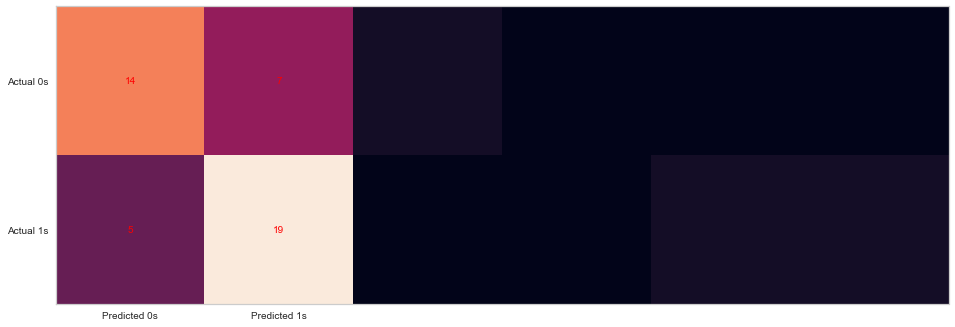

In [ ]:

from sklearn.ensemble import RandomForestClassifier
clf4 = OneVsRestClassifier(RandomForestClassifier(n_estimators=200 ,min_samples_split=2 ,min_samples_leaf=5, n_jobs=-1,  random_state=1367))
clf4.fit(X_train , y_train)
y4 = clf4.predict(X_test)
#print (classification_report(y_test , y4))
print( "Classification Accuracy = " + str(accuracy_score(y_test , y4)))
#confusion matrix
cm = confusion_matrix(y_test, clf4.predict(X_test))

fig, ax = plt.subplots(figsize=(16, 16))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted 0s', 'Predicted 1s'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual 0s', 'Actual 1s'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='red')
plt.show()

# KNN algorithm

0.6577181208053692
[0.6307692307692307, 0.6461538461538462, 0.7230769230769231, 0.6923076923076923, 0.6923076923076923, 0.7076923076923077, 0.7076923076923077, 0.7076923076923077, 0.676923076923077]


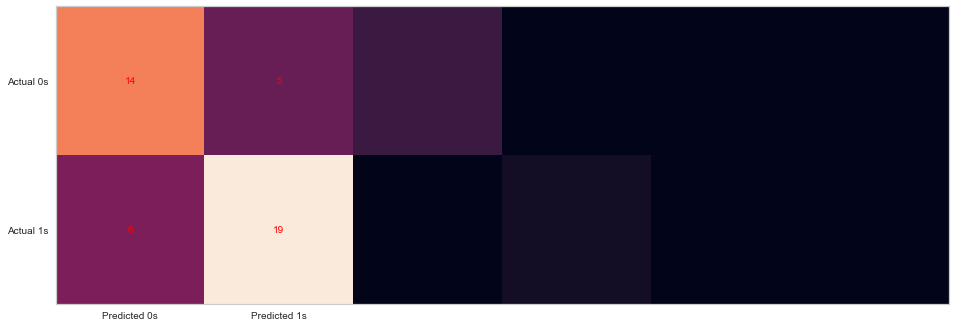

In [ ]:

from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier

Scores = []

for i in range (1,10):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    score = knn.score(X_test,y_test)
    Scores.append(score)

print(knn.score(X_train,y_train))
print(Scores)


cm = confusion_matrix(y_test, knn.predict(X_test))

fig, ax = plt.subplots(figsize=(16, 16))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted 0s', 'Predicted 1s'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual 0s', 'Actual 1s'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='red')
plt.show()

In [ ]:
from sklearn import tree

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (100,100), dpi=300)
tree.plot_tree(tree_model)

[Text(0.5140845070422535, 0.95, 'X[2] <= 3.345\ngini = 0.751\nsamples = 149\nvalue = [48, 50, 13, 12, 7, 19]'),
 Text(0.2711267605633803, 0.85, 'X[7] <= 0.4\ngini = 0.738\nsamples = 58\nvalue = [1, 18, 1, 12, 7, 19]'),
 Text(0.14788732394366197, 0.75, 'X[5] <= 0.03\ngini = 0.706\nsamples = 40\nvalue = [1, 17, 1, 11, 7, 3]'),
 Text(0.056338028169014086, 0.65, 'X[0] <= 1.524\ngini = 0.219\nsamples = 8\nvalue = [0, 1, 0, 0, 7, 0]'),
 Text(0.028169014084507043, 0.55, 'gini = 0.0\nsamples = 7\nvalue = [0, 0, 0, 0, 7, 0]'),
 Text(0.08450704225352113, 0.55, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0, 0, 0]'),
 Text(0.23943661971830985, 0.65, 'X[3] <= 1.5\ngini = 0.621\nsamples = 32\nvalue = [1, 16, 1, 11, 0, 3]'),
 Text(0.14084507042253522, 0.55, 'X[4] <= 74.495\ngini = 0.357\nsamples = 14\nvalue = [1, 11, 0, 0, 0, 2]'),
 Text(0.11267605633802817, 0.45, 'X[5] <= 0.52\ngini = 0.272\nsamples = 13\nvalue = [1, 11, 0, 0, 0, 1]'),
 Text(0.08450704225352113, 0.35, 'gini = 0.0\nsamples = 8\nvalue

0.6577181208053692
[0.6307692307692307, 0.6461538461538462, 0.7230769230769231, 0.6923076923076923, 0.6923076923076923, 0.7076923076923077, 0.7076923076923077, 0.7076923076923077, 0.676923076923077]


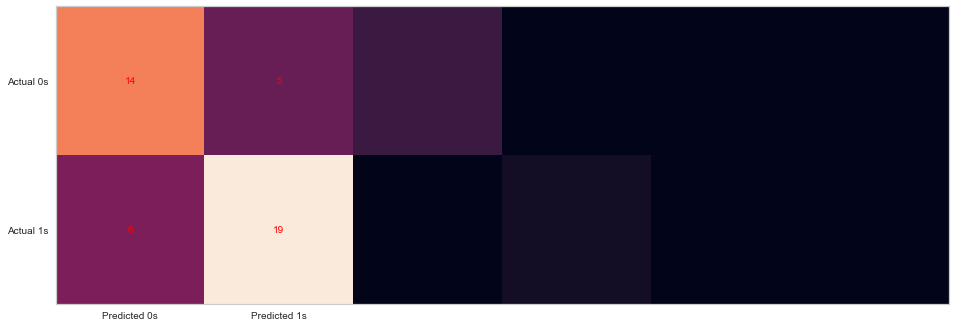

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier

Scores = []

for i in range (1,10):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    score = knn.score(X_test,y_test)
    Scores.append(score)

print(knn.score(X_train,y_train))
print(Scores)


cm = confusion_matrix(y_test, knn.predict(X_test))

fig, ax = plt.subplots(figsize=(16, 16))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted 0s', 'Predicted 1s'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual 0s', 'Actual 1s'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='red')
plt.show()

# Best Accuracy

In [ ]:
import operator
Accuracy_score = {}

Accuracy_score['Logistic Regression'] = 100
Accuracy_score['Decision Tree'] = 199
Accuracy_score['Random Forest'] = 500
Accuracy_score['K Nearest Neighbours'] = 50
Accuracy_score['Naive Bayes'] = 256
AccuracyMax = max(Accuracy_score.items(), key = operator.itemgetter(1))[0]
print("The best algorithm for our dataset is", AccuracyMax)
print(f"The corresponding accuracy for the algorithm is {Accuracy_score[AccuracyMax]}")

The best algorithm for our dataset is Random Forest
The corresponding accuracy for the algorithm is 500


# REVIEW 2

# K Means Clustering

In [ ]:
#Import required module
from sklearn.cluster import KMeans

#Initialize the class object
kmeans = KMeans(n_clusters= 10)

#predict the labels of clusters.
label = kmeans.fit_predict(X_train)

print(label)

[0 6 7 3 7 8 7 0 7 0 7 1 7 7 3 3 0 1 1 7 6 7 7 0 0 7 7 6 7 3 3 7 6 9 0 7 0
 4 7 7 7 7 3 6 4 0 7 7 6 0 7 0 7 0 7 7 7 7 1 7 5 7 0 0 2 0 7 7 1 7 7 3 1 7
 7 0 3 0 7 7 7 7 7 0 1 5 7 5 7 0 1 7 7 0 0 7 1 7 6 0 7 6 0 7 7 1 1 7 7 6 7
 6 7 7 7 7 0 0 7 7 0 7 7 3 0 7 0 7 7 4 0 7 6 7 3 1 7 3 4 2 7 7 3 4 7 7 6 0
 7]


In [ ]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

kmc = KMeans(n_clusters = 7)
kmc.fit(X_train, y_train)

ykmc = kmc.predict(X_test)
print ("Classification Accuracy = " + str(accuracy_score(y_test , ykmc)))
print (classification_report(y_test , ykmc))

Classification Accuracy = 0.03076923076923077
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.00      0.00      0.00        22
           2       0.00      0.00      0.00        26
           3       0.05      0.50      0.09         4
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         1
           6       0.00      0.00      0.00         2
           7       0.00      0.00      0.00        10

    accuracy                           0.03        65
   macro avg       0.01      0.06      0.01        65
weighted avg       0.00      0.03      0.01        65



In [ ]:
X_train

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
63,1.52227,14.17,3.81,0.78,71.35,0.00,9.69,0.00,0.00
129,1.52020,13.98,1.35,1.63,71.76,0.39,10.56,0.00,0.18
147,1.51610,13.33,3.53,1.34,72.67,0.56,8.33,0.00,0.00
204,1.51617,14.95,0.00,2.27,73.30,0.00,8.71,0.67,0.00
101,1.51730,12.35,2.72,1.63,72.87,0.70,9.23,0.00,0.00
...,...,...,...,...,...,...,...,...,...
30,1.51768,12.65,3.56,1.30,73.08,0.61,8.69,0.00,0.14
126,1.51667,12.94,3.61,1.26,72.75,0.56,8.60,0.00,0.00
174,1.52058,12.85,1.61,2.17,72.18,0.76,9.70,0.24,0.51
160,1.51832,13.33,3.34,1.54,72.14,0.56,8.99,0.00,0.00


# Dendogram for Clustering

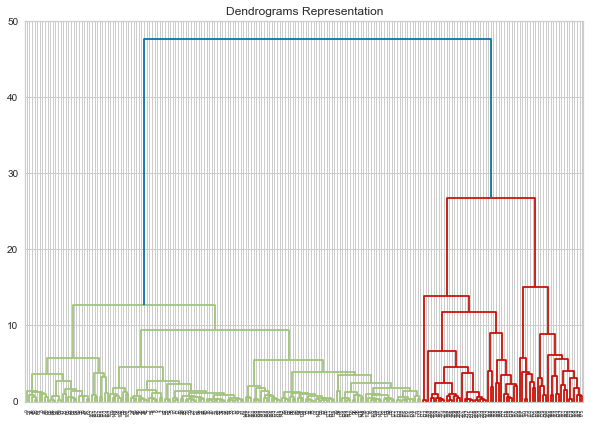

In [ ]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10,7))
plt.title("Dendrograms Representation")
dend = shc.dendrogram(shc.linkage(glass, method='ward'))

# AgglomerativeClustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
cluster.fit_predict(glass)

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)

In [ ]:
cluster.fit(X_train)
cluster_y_preds = cluster.fit_predict(X_test)
cluster_y_preds

array([1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1],
      dtype=int64)

In [ ]:
y_test_agg = y_test['Type']

In [ ]:
##43
agcl_preds = pd.DataFrame({"Predicted":cluster_y_preds,"Actual":y_test_agg})
agcl_preds

,Predicted,Actual
67,1,1
134,1,2
3,1,1
100,1,2
143,1,2
...,...,...
25,1,1
207,0,7
18,1,1
206,0,7


In [ ]:
agcl_TP = len(agcl_preds[(agcl_preds["Predicted"]==agcl_preds["Actual"])&(agcl_preds["Predicted"]==1)])
agcl_FP = len(agcl_preds[(agcl_preds["Predicted"]!=agcl_preds["Actual"])&(agcl_preds["Predicted"]==1)])
agcl_FN = len(agcl_preds[(agcl_preds["Predicted"]!=agcl_preds["Actual"])&(agcl_preds["Predicted"]==0)])
agcl_TN = len(agcl_preds[(agcl_preds["Predicted"]==agcl_preds["Actual"])&(agcl_preds["Predicted"]==0)])
print(agcl_TP,agcl_FP,agcl_FN,agcl_TN)
print("Rightly Classified: ",(agcl_TP+agcl_TN),"/",(agcl_TP+agcl_FP+agcl_FN+agcl_TN))
print("Wrongly Classified: ",(agcl_FP+agcl_FN),"/",(agcl_TP+agcl_FP+agcl_FN+agcl_TN))

agcl_Accuracy = (agcl_TP+agcl_TN)/(agcl_TP+agcl_FP+agcl_FN+agcl_TN)
agcl_Precision = (agcl_TP)/(agcl_TP+agcl_FP)
agcl_Recall = (agcl_TP)/(agcl_TP+agcl_FN)
agcl_Specificity = (agcl_TN)/(agcl_TN+agcl_FP)
agcl_F1 = (2*agcl_Precision*agcl_Recall)/(agcl_Precision+agcl_Recall)

22 30 13 0
Rightly Classified:  22 / 65
Wrongly Classified:  43 / 65


In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
accuracy = accuracy_score(y_test, cluster_y_preds)
print("Accuracy Score:",(accuracy))

Accuracy Score: 0.3384615384615385


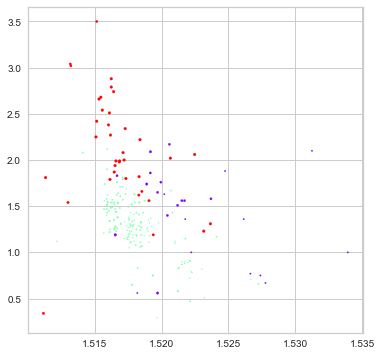

In [ ]:
ac3 = AgglomerativeClustering(n_clusters = 3, affinity='euclidean', linkage='ward')

plt.figure(figsize =(6, 6))
plt.scatter(glass['RI'],glass['Al'], glass['Type'],
           c = ac3.fit_predict(glass), cmap ='rainbow')
plt.show()

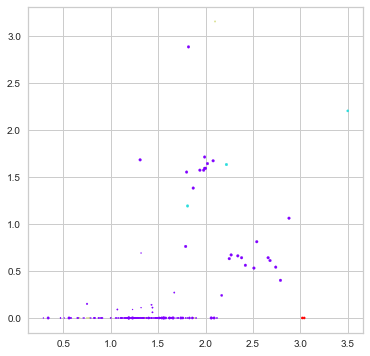

In [ ]:
ac2 = AgglomerativeClustering(n_clusters = 4, affinity='manhattan', linkage='average')

plt.figure(figsize =(6, 6))
plt.scatter(glass['Al'],glass['Ba'], glass['Type'], c = ac2.fit_predict(glass), cmap ='rainbow')
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
silhouette_scores.append(
        silhouette_score(glass, cluster.fit_predict(glass)))
silhouette_scores.append(
        silhouette_score(glass, ac3.fit_predict(glass)))
silhouette_scores.append(
        silhouette_score(glass, ac2.fit_predict(glass)))

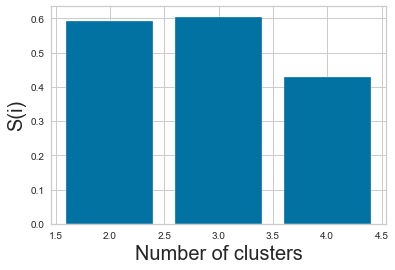

In [ ]:
plt.bar([2,3,4], silhouette_scores)
plt.xlabel('Number of clusters', fontsize = 20)
plt.ylabel('S(i)', fontsize = 20)
plt.show()

# Non-Linear SVM

Accuracy:  0.6711409395973155


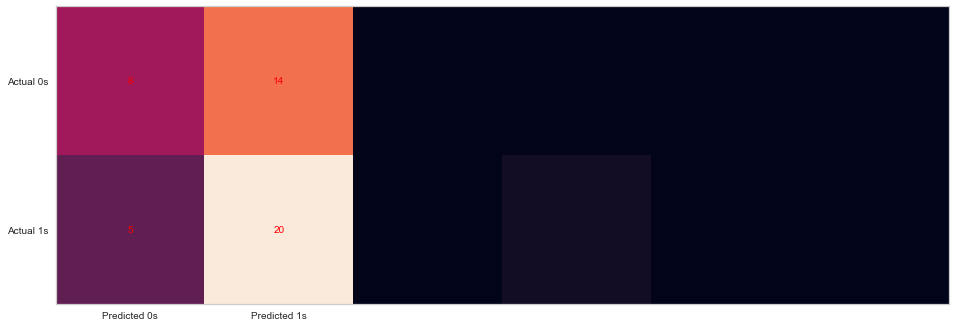

In [ ]:
from sklearn.svm import SVC

svm_model = SVC(gamma='auto').fit(X_train, y_train)
svm_predictions = svm_model.predict(X_test)

acc_train = svm_model.score(X_train, y_train)
acc_test = svm_model.score(X_test, y_test)

print("Accuracy: ",acc_train)
#confusion matrix
cm = confusion_matrix(y_test, svm_model.predict(X_test))

fig, ax = plt.subplots(figsize=(16, 16))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted 0s', 'Predicted 1s'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual 0s', 'Actual 1s'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='red')
plt.show()

In [ ]:
clf2 = OneVsRestClassifier(SVC(kernel='linear',C = 1,probability=True,random_state=1367))
clf2.fit(X_train , y_train)
y2 = clf2.predict(X_test)
print (classification_report(y_test , y2))
print ("Classification Accuracy = " + str(accuracy_score(y_test , y2)))

              precision    recall  f1-score   support

           1       0.50      0.82      0.62        22
           2       0.73      0.31      0.43        26
           3       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         1
           6       0.50      0.50      0.50         2
           7       0.71      1.00      0.83        10

    accuracy                           0.57        65
   macro avg       0.41      0.44      0.40        65
weighted avg       0.59      0.57      0.53        65

Classification Accuracy = 0.5692307692307692


# Gradient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
gb = (GradientBoostingClassifier(n_estimators=100 , random_state=50))
gb.fit(X_train , y_train)
ygb = gb.predict(X_test)
print("Classification Accuracy = " + str(accuracy_score(y_test , ygb)))
print (classification_report(y_test , ygb))

Classification Accuracy = 0.8307692307692308
              precision    recall  f1-score   support

           1       0.84      0.73      0.78        22
           2       0.83      0.96      0.89        26
           3       0.00      0.00      0.00         4
           5       1.00      1.00      1.00         1
           6       0.67      1.00      0.80         2
           7       1.00      1.00      1.00        10

    accuracy                           0.83        65
   macro avg       0.72      0.78      0.75        65
weighted avg       0.81      0.83      0.82        65



In [ ]:
print(ygb)

[1 2 1 2 2 2 5 7 2 7 2 1 7 1 1 1 2 2 1 1 2 1 1 7 3 6 2 2 2 7 2 2 2 2 2 2 2
 2 2 2 1 2 2 1 6 2 1 1 2 1 6 1 1 7 2 2 7 2 7 3 1 7 1 7 2]


# Dimentionality Reduction

# PCA

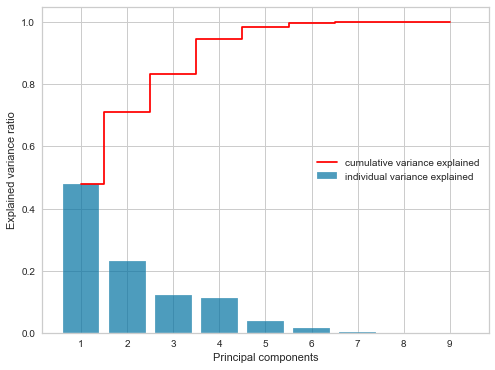

                      P1    P2    P3    P4    P5    P6    P7   P8   P9
Explained_Variance  3.28  1.59  0.84  0.77  0.27  0.09  0.01  0.0  0.0


In [ ]:
from sklearn.decomposition import PCA # dimensionality reduction#
pca = PCA(random_state = 1)
pca.fit(X_train)
var_exp = pca.explained_variance_ratio_
cum_var_exp = np.cumsum(var_exp)
plt.figure(figsize=(8,6))
plt.bar(range(1,len(cum_var_exp)+1), var_exp, align= 'center', label= 'individual variance explained', \
       alpha = 0.7)
plt.step(range(1,len(cum_var_exp)+1), cum_var_exp, where = 'mid' , label= 'cumulative variance explained', \
        color= 'red')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.xticks(np.arange(1,len(var_exp)+1,1))
plt.legend(loc='center right')
plt.show()

# Cumulative variance explained
var_df = pd.DataFrame(pca.explained_variance_.round(2), index=["P" + str(i) for i in range(1,10)],
                      columns=["Explained_Variance"])
print(var_df.T)

In [ ]:
import plotly.express as px
from sklearn.decomposition import PCA

df = px.data.iris()


pca = PCA(n_components=2)
components = pca.fit_transform(X)

fig = px.scatter(components, x=0, y=1, color=glass['Type'])
fig.show()


It appears that about 99 % of the variance can be explained with the first 5 principal components. However feeding the PCA features to the learning algorithms did not contribute to a better performance. This might be due to the non-linearites that PCA is not able to capture.

In [ ]:
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import numpy as np

#Load Data
#data = load_digits().data
pca = PCA(2)

#Transform the data
df = pca.fit_transform(X_train)

In [ ]:
pca_red = PCA(n_components=5)
X_reduced = pca_red.fit_transform(X_train)

Support Vector Classifier: 66.444444 (+/- 3.725123) performed in 7.096756 seconds
k-nearest neighbors : 61.055556 (+/- 8.603222) performed in 1.425621 seconds
Random forest: 76.555556 (+/- 5.226948) performed in 1.566286 seconds
Gradient boosting: 70.500000 (+/- 5.346338) performed in 1.320131 seconds
Logistic Regression: 63.777778 (+/- 8.551947) performed in 0.104656 seconds
KMeans: 10.722222 (+/- 4.960648) performed in 0.520908 seconds


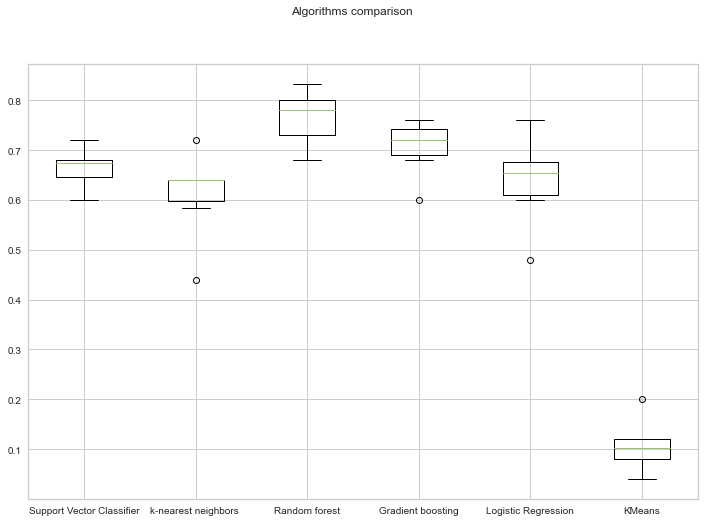

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from time import time
n_components = 5
pipelines = []
n_estimators = 200

#print(df.shape)
pipelines.append( ('Support Vector Classifier',
                   Pipeline([
                              ('sc', StandardScaler()),
#                               ('pca', PCA(n_components = n_components, random_state=seed ) ),
                             ('SVC', SVC(random_state=None))]) ) )


pipelines.append(('k-nearest neighbors ',
                  Pipeline([
                              ('sc', StandardScaler()),
#                             ('pca', PCA(n_components = n_components, random_state=seed ) ),
                            ('KNN', KNeighborsClassifier()) ])))
pipelines.append( ('Random forest',
                   Pipeline([
                              ('sc', StandardScaler()),
#                              ('pca', PCA(n_components = n_components, random_state=seed ) ),
                             ('RF', RandomForestClassifier(random_state=None, n_estimators=n_estimators)) ]) ))

pipelines.append( ('Gradient boosting',
                   Pipeline([
                             ('sc', StandardScaler()),
#                             ('pca', PCA(n_components = n_components, random_state=seed ) ),
                             ('GB', GradientBoostingClassifier(random_state=None)) ]) ))

pipelines.append( ('Logistic Regression',
                   Pipeline([
                              ('sc', StandardScaler()),
#                               ('pca', PCA(n_components = n_components, random_state=seed ) ),
                             ('LR', LogisticRegression(random_state=None)) ]) ))

pipelines.append( ('KMeans',
                   Pipeline([
                             ('sc', StandardScaler()),
#                             ('pca', PCA(n_components = n_components, random_state=seed ) ),
                             ('KM', KMeans(random_state=None)) ]) ))


results, names, times  = [], [] , []
num_folds = 6
scoring = 'accuracy'

for name, model in pipelines:
    start = time()
    kfold = StratifiedKFold(n_splits=num_folds, random_state=None)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring = scoring,
                                n_jobs=-1)
    t_elapsed = time() - start
    results.append(cv_results)
    names.append(name)
    times.append(t_elapsed)
    msg = "%s: %f (+/- %f) performed in %f seconds" % (name, 100*cv_results.mean(),
                                                       100*cv_results.std(), t_elapsed)
    print(msg)


fig = plt.figure(figsize=(12,8))
fig.suptitle("Algorithms comparison")
ax = fig.add_subplot(1,1,1)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

**Removing Redundant Parameters**

**PCA Decomposition**

In [ ]:
from sklearn.decomposition import PCA
def pca_transformation(df, n):
    pca_model = PCA(n_components=n)

    df = pca_model.fit_transform(df)

    columns_list = []
    for i in range(1,n+1):
        columns_list.append("PC"+str(i))

    df = pd.DataFrame(df, columns=columns_list)

    return df

In [ ]:
Glass_red = pca_transformation(X_train, 5)

In [ ]:
Glass_red

,PC1,PC2,PC3,PC4,PC5
0,-0.265982,-1.235461,-0.719296,-1.547384,-0.315703
1,1.995580,0.116306,-0.139206,-0.914491,-0.342896
2,-1.127965,-0.243828,-0.013900,0.091543,-0.052462
3,1.493686,2.751807,-1.131323,0.168411,0.130324
4,0.108390,-0.471226,0.679631,0.723794,0.234550
...,...,...,...,...,...
144,-0.870538,-0.675640,0.272947,0.722821,0.112350
145,-0.968742,-0.602620,0.155414,0.309628,0.043768
146,1.220042,0.283783,0.818762,-0.060449,0.342167
147,-0.487503,-0.486864,0.175710,-0.405237,-0.005782


**Observation:** The best performances are achieved by RF. However, RF also yields a wide distribution. It is worthy to continue our study by tuning RF.

**Logistic Regression performs badly.** This might be due to the fact that the data is not normally distributed as these algorithms perform well when data that is normally distributed.

# Hyper Parameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
tuned_parameters = [{'kernel': ['rbf','linear'], 'gamma': [0.001, 0.01, 0.1, 10],
                     'C': [0.001, 0.01, 0.1, 1, 10]}]
grid = GridSearchCV(SVC(), tuned_parameters, cv=5, scoring='accuracy')
grid.fit(X_train, y_train.values.ravel()) #to change y into Is array - error

print("Best parameters set found on development set:")
print()
print(grid.best_params_)

Best parameters set found on development set:

{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


In [ ]:
import sklearn.metrics as metrics
model = grid.best_estimator_
model.fit(X_train,y_train.values.ravel())
y_pred = model.predict(X_test)
metrics.accuracy_score(y_pred,y_test)
print("Accuracy Score:",accuracy_score(y_test,y_pred))

Accuracy Score: 0.7538461538461538


**Observation:** The best performances are achieved by RF. However, RF also
yields a wide distribution. It is worthy to continue our study by tuning RF.

**Logistic Regression performs badly.** This might be due to the fact that the
data is not normally distributed as these algorithms perform well when data
that is normally distributed.

# Neural Networks

In [ ]:
y = glass["Type"]

x_train,x_test,y_train,y_test=train_test_split(X_scaled,y,test_size=0.3)

from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(hidden_layer_sizes=(8,8,8), activation='relu', solver='adam', max_iter=500)
mlp.fit(x_train, y_train)
ynn = mlp.predict(x_test)
print("Accuracy Score: ",accuracy_score(ynn,y_test))

Accuracy Score:  0.5230769230769231


In [ ]:
y = glass["Type"]

x_train,x_test,y_train,y_test=train_test_split(X_scaled,y,test_size=0.3)

from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(hidden_layer_sizes=(8,8,8), activation='relu', solver='adam', max_iter=500)
mlp.fit(x_train, y_train)
ynn = mlp.predict(x_test)
print("Accuracy Score: ",accuracy_score(ynn,y_test))

Accuracy Score:  0.6153846153846154


**Observations:**

Gradient Boosting performs better than all other algorithms for this classification problem